In [1]:
%matplotlib inline
# %matplotlib notebook
from datetime import datetime,timedelta
import os
import json
import requests
import hmac
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
from scipy.stats import linregress
import time
import pandas_datareader as pdr
import datetime as dt
import seaborn as sns
import plotly.express as px
import yfinance as yf



In [2]:
file = "2021_2022_FTX_USDBTC_1H.csv"

btcusd_1h = pd.read_csv(file)
df = btcusd_1h
df
# df = btcusd_1h
# df

,date,hour,open,high,low,close,volume,ohlc4,SMA48,average_true_range,EMA9,EMA48,10x short,25x short,50x short,100x short,10x long,25x long,50x long,100x long
0,2021-01-01 05:00:00,5.0,29280.5,29296.0,29146.5,29240.0,5.523795e+06,29240.750,NaN,NaN,29240.750000,29240.750000,32310.220994,30301.295337,29686.040609,29390.672115,26703.881279,28251.932367,28808.620690,29092.349631
1,2021-01-01 06:00:00,6.0,29240.0,29315.0,29127.5,29231.0,7.436047e+06,29228.375,NaN,NaN,29238.275000,29240.244898,32307.486188,30298.730570,29683.527919,29388.184426,26701.621005,28249.541063,28806.182266,29089.887192
2,2021-01-01 07:00:00,7.0,29231.0,29241.5,28887.0,29168.0,8.430755e+06,29131.875,NaN,NaN,29216.995000,29235.821637,32283.972376,30276.678756,29661.923858,29366.795320,26682.187215,28228.980676,28785.216749,29068.715190
3,2021-01-01 08:00:00,8.0,29168.0,29251.0,28928.5,29061.0,7.003067e+06,29102.125,NaN,NaN,29194.021000,29230.364631,32258.586740,30252.871503,29638.600000,29343.703528,26661.206393,28206.783575,28762.582266,29045.857786
4,2021-01-01 09:00:00,9.0,29061.0,29379.5,29041.5,29275.0,5.764370e+06,29189.250,NaN,NaN,29193.066800,29228.686483,32257.532376,30251.882694,29637.631269,29342.744436,26660.334977,28205.861643,28761.642167,29044.908429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14050,2022-08-09 15:00:00,15.0,23101.0,23160.0,23038.0,23081.0,1.924943e+07,23095.000,23632.119792,164.857143,23338.068187,23559.666157,25787.920649,24184.526619,23693.470241,23457.726286,21313.304281,22548.858152,22993.170628,23219.624647
14051,2022-08-09 16:00:00,16.0,23081.0,23121.0,22994.0,23075.0,1.547004e+07,23067.750,23632.192708,160.500000,23284.004550,23539.587946,25728.181823,24128.502124,23638.583299,23403.385455,21263.931096,22496.622753,22939.905960,23165.835389
14052,2022-08-09 17:00:00,17.0,23075.0,23133.0,22975.0,23056.0,1.930767e+07,23059.750,23629.583333,167.000000,23239.153640,23520.002724,25678.622806,24082.024497,23593.049381,23358.304587,21222.971361,22453.288541,22895.717872,23121.212103
14053,2022-08-09 18:00:00,18.0,23056.0,23077.0,22993.0,23062.0,1.661885e+07,23047.000,23625.645833,165.714286,23200.722912,23500.696490,25636.157914,24042.199909,23554.033413,23319.676819,21187.874805,22416.157403,22857.855086,23082.976416


In [3]:
df = df.set_index('date')
df


,hour,open,high,low,close,volume,ohlc4,SMA48,average_true_range,EMA9,EMA48,10x short,25x short,50x short,100x short,10x long,25x long,50x long,100x long
date,,,,,,,,,,,,,,,,,,,
2021-01-01 05:00:00,5.0,29280.5,29296.0,29146.5,29240.0,5.523795e+06,29240.750,NaN,NaN,29240.750000,29240.750000,32310.220994,30301.295337,29686.040609,29390.672115,26703.881279,28251.932367,28808.620690,29092.349631
2021-01-01 06:00:00,6.0,29240.0,29315.0,29127.5,29231.0,7.436047e+06,29228.375,NaN,NaN,29238.275000,29240.244898,32307.486188,30298.730570,29683.527919,29388.184426,26701.621005,28249.541063,28806.182266,29089.887192
2021-01-01 07:00:00,7.0,29231.0,29241.5,28887.0,29168.0,8.430755e+06,29131.875,NaN,NaN,29216.995000,29235.821637,32283.972376,30276.678756,29661.923858,29366.795320,26682.187215,28228.980676,28785.216749,29068.715190
2021-01-01 08:00:00,8.0,29168.0,29251.0,28928.5,29061.0,7.003067e+06,29102.125,NaN,NaN,29194.021000,29230.364631,32258.586740,30252.871503,29638.600000,29343.703528,26661.206393,28206.783575,28762.582266,29045.857786
2021-01-01 09:00:00,9.0,29061.0,29379.5,29041.5,29275.0,5.764370e+06,29189.250,NaN,NaN,29193.066800,29228.686483,32257.532376,30251.882694,29637.631269,29342.744436,26660.334977,28205.861643,28761.642167,29044.908429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-09 15:00:00,15.0,23101.0,23160.0,23038.0,23081.0,1.924943e+07,23095.000,23632.119792,164.857143,23338.068187,23559.666157,25787.920649,24184.526619,23693.470241,23457.726286,21313.304281,22548.858152,22993.170628,23219.624647
2022-08-09 16:00:00,16.0,23081.0,23121.0,22994.0,23075.0,1.547004e+07,23067.750,23632.192708,160.500000,23284.004550,23539.587946,25728.181823,24128.502124,23638.583299,23403.385455,21263.931096,22496.622753,22939.905960,23165.835389
2022-08-09 17:00:00,17.0,23075.0,23133.0,22975.0,23056.0,1.930767e+07,23059.750,23629.583333,167.000000,23239.153640,23520.002724,25678.622806,24082.024497,23593.049381,23358.304587,21222.971361,22453.288541,22895.717872,23121.212103


In [4]:
#find index of date for the most recent week

recent = df['2022-08-01':'2022-08-08']
last = df['2021-08-01':'2021-08-08']

# print(df.loc[pd.Timestamp(df.index - timedelta(6)), 'average_true_range'])
# print(df.iloc[0]['date'])
# recent = df.loc['2022-8-1':'2022-8-7']
# recent
# start_date = end_date - dt.timedelta(days=6)
# thisweek = df.iloc(['date']==)

In [5]:
fig1 = make_subplots(specs=[[{"secondary_y": True}]])

fig1.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=df['average_true_range'], name="ATR"),
    secondary_y=False
)

fig1.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['close'], name="BTCUSD(close)"),
    secondary_y=True,
)

fig1.update_layout(
    title={
        'text' : "ATR and BTCUSD closing price (USD)"
    }
)

fig1.update_xaxes(
    title = {
        'text' : "Date"
    }
)

fig1.show()

# fig1.write_image("BTCUSD risk(ATR)1.png")

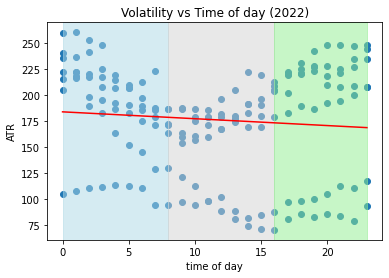

In [6]:
average_true_range_scatter_recent = recent.average_true_range
hour_scatter_recent = recent.hour

x_values = np.array(hour_scatter_recent)
y_values = np.array(average_true_range_scatter_recent)

# type(x_values)
# print(x_values)

(slope, intercept, rvalue, pvalue, stderr)=linregress(x_values,y_values)
regress_values = x_values * slope + intercept
line_eq = "y= " + str(round(slope,2)) + "x +" + str(round(intercept, 2))

plt.scatter(x_values,y_values)
plt.plot(x_values, regress_values, "r-")

plt.title("Volatility vs Time of day (2022)")
plt.xlabel("time of day")
plt.ylabel("ATR")


plt.axvspan(hour_scatter_recent[0],hour_scatter_recent[8], color ='lightblue', alpha=0.5)
plt.axvspan(hour_scatter_recent[8],hour_scatter_recent[16], color ='lightgray', alpha=0.5)
plt.axvspan(hour_scatter_recent[16],hour_scatter_recent[23], color ='lightgreen', alpha=0.5)

plt.show()

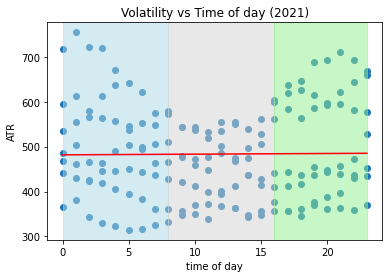

In [7]:
average_true_range_scatter_last = last.average_true_range
hour_scatter_last = last.hour

x_values = np.array(hour_scatter_last)
y_values = np.array(average_true_range_scatter_last)

# type(x_values)
# print(x_values)

(slope, intercept, rvalue, pvalue, stderr)=linregress(x_values,y_values)
regress_values = x_values * slope + intercept
line_eq = "y= " + str(round(slope,2)) + "x +" + str(round(intercept, 2))

plt.scatter(x_values,y_values)
plt.plot(x_values, regress_values, "r-")

plt.title("Volatility vs Time of day (2021)")
plt.xlabel("time of day")
plt.ylabel("ATR")

plt.axvspan(hour_scatter_recent[0],hour_scatter_recent[8], color ='lightblue', alpha=0.5)
plt.axvspan(hour_scatter_recent[8],hour_scatter_recent[16], color ='lightgray', alpha=0.5)
plt.axvspan(hour_scatter_recent[16],hour_scatter_recent[23], color ='lightgreen', alpha=0.5)

plt.show()

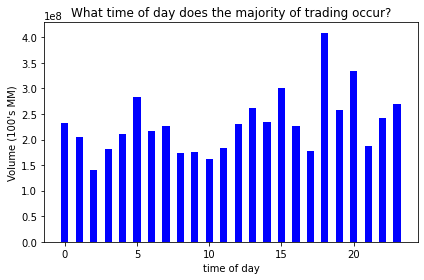

In [8]:
#plot bar chart volume vs. time of day
volume_scatter = df['volume']
hour_scatter=df['hour']

x_axis = hour_scatter
y_axis = volume_scatter

plt.bar(x_axis, y_axis, color ="b", align ='center', width = .5)

#plt.rcParams["figure.figsize"] = [50, 50]
plt.title("What time of day does the majority of trading occur?")
plt.xlabel("time of day")
plt.ylabel("Volume (100's MM)")
plt.tight_layout()

plt.show()


In [9]:
end_date = datetime(2022,8,7)

start_date = end_date - dt.timedelta(days=63)

btcusd_1h['close']


window = 24*1

bitcoin_max = btcusd_1h['close'].rolling(window, min_periods=1).max()

hourly_drawdown = btcusd_1h['close']/bitcoin_max-1

bitcoin_draw = hourly_drawdown.rolling(window, min_periods=1).min()

bitcoin_draw 



0        0.000000
1       -0.000308
2       -0.002462
3       -0.006122
4       -0.006122
           ...   
14050   -0.045197
14051   -0.045197
14052   -0.045197
14053   -0.045197
14054   -0.045197
Name: close, Length: 14055, dtype: float64

In [10]:
hourly_drawdown


0        0.000000
1       -0.000308
2       -0.002462
3       -0.006122
4        0.000000
           ...   
14050   -0.041168
14051   -0.041417
14052   -0.042207
14053   -0.041957
14054   -0.041542
Name: close, Length: 14055, dtype: float64

In [11]:
bitcoin_draw_df = pd.DataFrame(columns=['Drawdowns'])
bitcoin_draw_df['Drawdowns'] = bitcoin_draw
bitcoin_draw_df.describe()

,Drawdowns
count,14055.000000
mean,-0.047067
std,0.033312
min,-0.222768
25%,-0.059524
50%,-0.039209
75%,-0.023740
max,0.000000


In [12]:
fig4 = go.Figure()



# set up layout
fig4.update_layout(
    title={
        'text' : "BTCUSD close 1H [Max Drawdown Analysis]",
        "x" : 0.5,
        'xanchor': 'center'
    },
    xaxis_title="Date",
    yaxis_title='Price',
    xaxis_rangeslider_visible=False
)

fig4.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['close'], name="BTC(close)")
    )

In [13]:
fig5 = go.Figure()



# set up layout
fig5.update_layout(
    title={
        'text' : "Loss percentage vs Date [Max Drawdown Analysis]",
        "x" : 0.5,
        'xanchor': 'center'
    },
    xaxis_title="Date",
    yaxis_title='Loss percentage',
    xaxis_rangeslider_visible=False
)

fig5.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=bitcoin_draw, name="Max Drawdown")
    )

fig5.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=hourly_drawdown, name="Hourly Drawdown")
    )

fig5.show()


In [14]:
# create a graph object
fig6 = go.Figure()

#set up layout
fig6.update_layout(
    title={
        'text' : "BTCUSD Candlestick (FTX)",
        "x" : 0.5,
        'xanchor': 'center'
    },
    xaxis_title="Date",
    yaxis_title='Price',
    xaxis_rangeslider_visible=False
)

#add candletstick
# fig6.add_trace(
#     go.Candlestick(
#         x=btcusd_1h['date'],
#         open=btcusd_1h['open'],
#         high=btcusd_1h['high'],
#         low=btcusd_1h['low'],
#         close=btcusd_1h['close'],
#         name="BTCUSD"
#     )
# )


fig6.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['ohlc4'], name="OHLC4")
)
fig6.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['SMA48'], name="SMA(48)")
)


fig6.show()

In [15]:
max13 = df['2022-07-13':'2022-07-14']
# recent
maxvol13 = max13.loc[max13['volume'].idxmax()]
max13

,hour,open,high,low,close,volume,ohlc4,SMA48,average_true_range,EMA9,EMA48,10x short,25x short,50x short,100x short,10x long,25x long,50x long,100x long
date,,,,,,,,,,,,,,,,,,,
2022-07-13 00:00:00,0.0,19308.0,19422.0,19246.0,19409.0,1.828553e+07,19346.25,20067.880208,200.285714,19493.509760,20044.107657,21539.789790,20200.528248,19790.365238,19593.456178,17802.292018,18834.308947,19205.428335,19394.577822
2022-07-13 01:00:00,1.0,19409.0,19456.0,19362.0,19413.0,9.912772e+06,19410.00,20041.817708,191.071429,19476.807808,20018.225712,21521.334594,20183.220526,19773.408942,19576.668592,17787.039094,18818.171795,19188.973210,19377.960635
2022-07-13 02:00:00,2.0,19413.0,19522.0,19407.0,19488.0,1.053066e+07,19457.50,20019.598958,186.000000,19472.946246,19995.338948,21517.067675,20179.218908,19769.488575,19572.787232,17783.512554,18814.440818,19185.168715,19374.118671
2022-07-13 03:00:00,3.0,19488.0,19555.0,19446.0,19454.0,8.142599e+06,19485.75,19997.838542,176.785714,19475.506997,19974.539399,21519.897234,20181.872536,19772.088322,19575.361112,17785.851139,18816.914973,19187.691623,19376.666426
2022-07-13 04:00:00,4.0,19454.0,19502.0,19409.0,19460.0,6.824240e+06,19456.25,19975.994792,166.714286,19471.655598,19953.384730,21515.641544,20177.881448,19768.178272,19571.489966,17782.333879,18813.193814,19183.897140,19372.834573
2022-07-13 05:00:00,5.0,19460.0,19556.0,19425.0,19501.0,9.066230e+06,19485.50,19954.807292,166.642857,19474.424478,19934.287394,21518.701081,20180.750754,19770.989318,19574.273043,17784.862537,18815.869061,19186.625102,19375.589401
2022-07-13 06:00:00,6.0,19501.0,19536.0,19455.0,19528.0,9.091998e+06,19505.00,19935.463542,163.714286,19480.539582,19916.765460,21525.458102,20187.087650,19777.197546,19580.419500,17790.447107,18821.777374,19192.649835,19381.673470
2022-07-13 07:00:00,7.0,19528.0,19833.0,19475.0,19686.0,3.149207e+07,19630.50,19919.208333,182.357143,19510.531666,19905.081155,21558.598526,20218.167529,19807.646361,19610.565358,17817.837138,18850.755233,19222.198686,19411.513340
2022-07-13 08:00:00,8.0,19686.0,19903.0,19652.0,19837.0,2.616938e+07,19769.50,19904.572917,187.714286,19562.325333,19899.547230,21615.829097,20271.839723,19860.228764,19662.624579,17865.137290,18900.797423,19273.226929,19463.044148


### *Sample Liquidation level (orange dashed line) derived from price and volume point of control (POC) on 2022-07-13* 

In [16]:
#sample visual for liquidation levels: need EMA does not work with SMA
Fig2 = go.Figure()

#set up layout
Fig2.update_layout(
    title={
        'text' : "BTCUSD Liquidation Levels",
        "x" : 0.5,
        'xanchor': 'center'
    },
    xaxis_title="Date",
    yaxis_title='Price',
    xaxis_rangeslider_visible=False
)

#add candletstick
Fig2.add_trace(
    go.Candlestick(
        x=btcusd_1h['date'],
        open=btcusd_1h['open'],
        high=btcusd_1h['high'],
        low=btcusd_1h['low'],
        close=btcusd_1h['close'],
        name="BTCUSD"
    )
)


Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['10x long'], name="10x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['10x short'], name="10x Rolling Liqs(short)"),
)
Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['25x long'], name="25x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['25x short'], name="25x Rolling Liqs(short)"),
)
Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['50x long'], name="50x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['50x short'], name="50x Rolling Liqs(short)"),
)
Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['100x long'], name="100x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['100x short'], name="100x Rolling Liqs(short)")
)

Fig2.add_hline(y=20212.978603, line_width=2, line_dash="dash", 
        line_color="orange", name="25x liquidation level for 2022-07-13")

Fig2.show()


### **Sample backtesting strategy for Jul-Aug 2022**

In [36]:
df_backtest = df.tail(1800).reset_index(drop=False)
df_backtest

,date,hour,open,high,low,close,volume,ohlc4,SMA48,average_true_range,EMA9,EMA48,10x short,25x short,50x short,100x short,10x long,25x long,50x long,100x long
0,2022-05-26 20:00:00,20.0,29357.0,29564.0,29259.0,29433.0,2.671067e+07,29403.25,29587.645833,383.000000,29382.908307,29494.644042,32467.301996,30448.609644,29830.363763,29533.559291,26833.706216,28389.283388,28948.678135,29233.786466
1,2022-05-26 21:00:00,21.0,29433.0,29666.0,29432.0,29553.0,2.322008e+07,29521.00,29587.942708,387.000000,29410.526645,29495.719796,32497.819497,30477.229684,29858.402686,29561.319233,26858.928443,28415.967773,28975.888320,29261.264639
2,2022-05-26 22:00:00,22.0,29553.0,29640.0,29458.0,29479.0,2.240801e+07,29532.50,29587.265625,338.000000,29434.921316,29497.221029,32524.774935,30502.509136,29883.168849,29585.838980,26881.206681,28439.537504,28999.922479,29285.535504
3,2022-05-26 23:00:00,23.0,29479.0,29531.0,29151.0,29171.0,3.872833e+07,29333.00,29580.661458,338.285714,29414.537053,29490.518130,32502.250887,30481.385547,29862.474165,29565.350203,26862.590916,28419.842563,28979.839461,29265.254693
4,2022-05-27 00:00:00,0.0,29171.0,29364.0,29012.0,29049.0,4.706367e+07,29149.00,29571.109375,354.071429,29361.429642,29476.578614,32443.568666,30426.351961,29808.558013,29511.970502,26814.090998,28368.531055,28927.516889,29212.416809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795,2022-08-09 15:00:00,15.0,23101.0,23160.0,23038.0,23081.0,1.924943e+07,23095.00,23632.119792,164.857143,23338.068187,23559.666157,25787.920649,24184.526619,23693.470241,23457.726286,21313.304281,22548.858152,22993.170628,23219.624647
1796,2022-08-09 16:00:00,16.0,23081.0,23121.0,22994.0,23075.0,1.547004e+07,23067.75,23632.192708,160.500000,23284.004550,23539.587946,25728.181823,24128.502124,23638.583299,23403.385455,21263.931096,22496.622753,22939.905960,23165.835389
1797,2022-08-09 17:00:00,17.0,23075.0,23133.0,22975.0,23056.0,1.930767e+07,23059.75,23629.583333,167.000000,23239.153640,23520.002724,25678.622806,24082.024497,23593.049381,23358.304587,21222.971361,22453.288541,22895.717872,23121.212103
1798,2022-08-09 18:00:00,18.0,23056.0,23077.0,22993.0,23062.0,1.661885e+07,23047.00,23625.645833,165.714286,23200.722912,23500.696490,25636.157914,24042.199909,23554.033413,23319.676819,21187.874805,22416.157403,22857.855086,23082.976416


In [62]:
pos_s = 0
pos_l = 0
num = 0
pnl = []
profit = []
loss = []
percentchange = []


for i in df_backtest.index:
    
    price = df_backtest['ohlc4'][i]
    #long entry
    if(df_backtest['ohlc4'][i]>df_backtest['SMA48'][i]):
        if(df_backtest['high'][i]>=df_backtest['25x short'][i]):
            
            for j in  range(0,25):
                if(df_backtest['low'][i+j] <= df_backtest['50x long'][i+j]):
                    # print('long2')
                    if(pos_l==0):
                        bp=price
                        pos_l=1
                        print(f'entered long at {bp}')
           
    #exit long and track PnL
    elif(df_backtest['ohlc4'][i]<df_backtest['SMA48'][i]):
        if(df_backtest['high'][i] >= df_backtest['50x short'][i]):
                if(pos_l==1):
                    pos_l=0
                    sp=price
                    print(f'Exiting Long at {sp}')
                    pc=(sp/bp-1)
                    percentchange.append(pc)
                    pnl.append(sp*pc)
                    
                    if sp*pc > 0:
                        profit.append(sp*pc)
                    else:
                        loss.append(sp*pc)

                    
        if(num==df_backtest['ohlc4'].count()-1 and pos_l==1):
            pos_l=0
            sp=price
            print(f'Exiting Long at {sp}')
            pc=(sp/bp-1)
            percentchange.append(pc)
            pnl.append(sp*pc)
            if sp*pc > 0:
                profit.append(sp*pc)
            else:
                loss.append(sp*pc)
                
        num+=1

#short entries
for i in df_backtest.index:   
    
    if(df_backtest['ohlc4'][i]<df_backtest['SMA48'][i]):
        if(df_backtest['low'][i]<=df_backtest['25x long'][i]):
            
            for j in  range(0,25):
                if(df_backtest['high'][i+j] <= df_backtest['50x short'][i+j]):
                    if(pos_s==0):
                        sp=price
                        pos_s=1
                        print(f'entered short at {bp}')
                        
    #exit short and track PnL
    elif(df_backtest['ohlc4'][i]>df_backtest['SMA48'][i]):
        if(df_backtest['low'][i] <= df_backtest['50x long'][i]):
                if(pos_s==1):
                    pos_s=0
                    sp=price
                    print(f'Exiting short at {sp}')
                    pc=(sp/bp-1)
                    percentchange.append(pc)
                    pnl.append(sp*pc)
                    if sp*pc > 0:
                        profit.append(sp*pc)
                    else:
                        loss.append(sp*pc)
                    
        if(num==df_backtest['ohlc4'].count()-1 and pos_s==1):
            pos_s=0
            sp=price
            print(f'Exiting Long at {sp}')
            pc=(sp/bp-1)
            percentchange.append(pc)
            pnl.append(sp*pc)
            if sp*pc > 0:
                profit.append(sp*pc)
            else:
                loss.append(sp*pc)
        num+=1
            
        

print(percentchange)     
print(num)   
    
        
# for i in df_backtest.index:
#     v_max = max()
    

entered long at 30694.75
Exiting Long at 27458.0
entered long at 21957.5
Exiting Long at 20726.0
entered long at 19759.5
Exiting Long at 19283.75
entered long at 19815.0
Exiting Long at 20505.25
entered long at 20208.5
Exiting Long at 19630.5
entered long at 22051.5
Exiting Long at 22878.5
entered long at 22156.25
Exiting Long at 23769.25
entered short at 22156.25
Exiting short at 23057.75
entered short at 22156.25
Exiting short at 23057.75
entered short at 22156.25
Exiting short at 23057.75
entered short at 22156.25
Exiting short at 23057.75
entered short at 22156.25
Exiting short at 23057.75
entered short at 22156.25
Exiting short at 23057.75
[-0.10544962900821797, -0.056085619947626064, -0.02407702624054253, 0.034834721170830196, -0.028601825964321925, 0.03750311770174375, 0.07280112834978847, 0.04068829337094493, 0.04068829337094493, 0.04068829337094493, 0.04068829337094493, 0.04068829337094493, 0.04068829337094493]
1800


## Edge calculations

In [71]:
pl = 4/13
pw = 9/13
aw = (sum(profit))/13
al = (sum(loss))/13

        
total_pnl = sum(pnl)
print(f'Winning Percent: {pw}, Average Winner: {aw} ,  Losing Percent: {pl},  Average Loser: {al},  Total Pnl: {round(total_pnl,2)}')


edge = (pw * aw)-(pl*al)
edge

Winning Percent: 0.6923076923076923, Average Winner: 687.0631494999349 ,  Losing Percent: 0.3076923076923077,  Average Loser: -391.04845936160234,  Total Pnl: 3848.19


595.9817063804479